In [2]:
import os
import inspect
import seaborn
import matplotlib
import matplotlib.pyplot as plt
import torch
import scanpy as sc
import tqdm
import sys

sc.settings.figdir=os.path.expanduser('~/WbFigures/RetinaAnalysis')

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

if torch.cuda.is_available():
    print("GPU is available")
    print("Number of GPUs:", torch.cuda.device_count())
    print("GPU Name:", torch.cuda.get_device_name(0))
else:
    print("GPU is not available")

sys.path.append('/home/matthew.schmitz/utils/mts-utils/')
from genomics import sc_analysis


import sys
sys.path.append('/home/matthew.schmitz/Matthew/code/scANTIPODE/')
import antipode
from antipode.antipode_model import *
import antipode.model_functions
from antipode.model_functions import *
import antipode.model_distributions
from antipode.model_distributions import *
import antipode.model_modules
from antipode.model_modules import *
import antipode.train_utils
from antipode.train_utils import *
import antipode.plotting
from antipode.plotting import *


GPU is available
Number of GPUs: 1
GPU Name: NVIDIA A100-PCIE-40GB


/home/matthew.schmitz/Matthew/utils/miniforge3/envs/antipode/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [ ]:
adata=sc.read_h5ad('/home/matthew.schmitz/Matthew/models/1.9.1.8.1_RunRetinaAllNoPsi/p4_adata.h5ad')
scvi_model=scvi.model.SCVI.load('/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/Team/Matthew/models/1.9.1.8.1_RunRetinaAllNoPsiSCVIsupervise',adata=adata) 
SCVI_LATENT_KEY = "X_SCVI"
adata.obsm[SCVI_LATENT_KEY] = scvi_model.get_latent_representation(adata)

np.savetxt("/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/Team/Matthew/models/RetinaAllIntegrations/X_SCVI.csv"), adata.obsm["X_SCVI"], delimiter=",")

# SCVI initialized ANTIPODE
Even poor initializations like this SCVI with batch and species controlled for can be rescued

In [2]:
adata=sc.read_h5ad('/home/matthew.schmitz/Matthew/1.9.1.6_RetinaSCVI.h5ad',backed='r')

OSError: Unable to synchronously open file (file signature not found)

In [ ]:
batch_key='batch'
discov_key='species'
layer_key='UMIs'


In [ ]:
MDE_KEY = "X_SCVI_MDE"
#adata.obsm[MDE_KEY] = clip_latent_dimensions(scvi.model.utils.mde(adata.obsm['X_SCVI'],init='random'),0.1)
sc.pl.embedding(
    adata,
    basis=MDE_KEY,
    color=["antipode_cluster","kmeans"],legend_fontsize=6,legend_fontweight='normal',
    legend_loc='on data',palette=sc.pl.palettes.godsnot_102
)

sc.pl.embedding(
    adata,
    basis=MDE_KEY,
    color=[x for x in adata.obs.columns if 'level' in x],
    palette=sc.pl.palettes.godsnot_102,
    legend_loc='on data'
)

sc.pl.embedding(
    adata,
    basis=MDE_KEY,
    color=["psi",'q_score',discov_key,batch_key],palette=sc.pl.palettes.godsnot_102,cmap='coolwarm'
)


/home/matthew.schmitz/Matthew/utils/miniforge3/envs/pyro/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/matthew.schmitz/Matthew/utils/miniforge3/envs/pyro/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


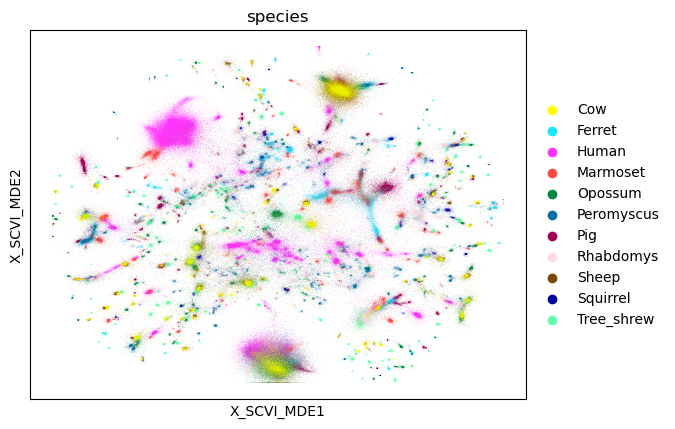

In [11]:
sc.pl.embedding(
    adata,
    basis='X_SCVI_MDE',
    color=["species"],palette=sc.pl.palettes.godsnot_102,cmap='coolwarm'
)


/home/matthew.schmitz/Matthew/utils/miniforge3/envs/pyro/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


/home/matthew.schmitz/Matthew/utils/miniforge3/envs/pyro/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/matthew.schmitz/Matthew/utils/miniforge3/envs/pyro/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/matthew.schmitz/Matthew/utils/miniforge3/envs/pyro/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


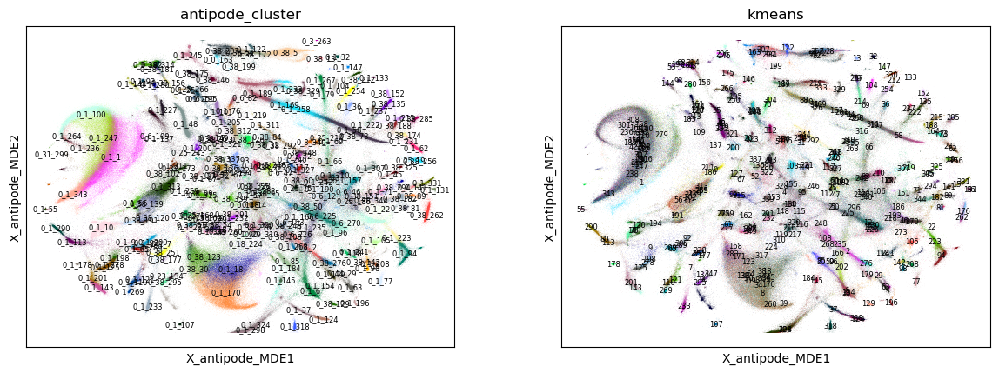

/home/matthew.schmitz/Matthew/utils/miniforge3/envs/pyro/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/matthew.schmitz/Matthew/utils/miniforge3/envs/pyro/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/matthew.schmitz/Matthew/utils/miniforge3/envs/pyro/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value t

/home/matthew.schmitz/Matthew/utils/miniforge3/envs/pyro/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/matthew.schmitz/Matthew/utils/miniforge3/envs/pyro/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/matthew.schmitz/Matthew/utils/miniforge3/envs/pyro/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


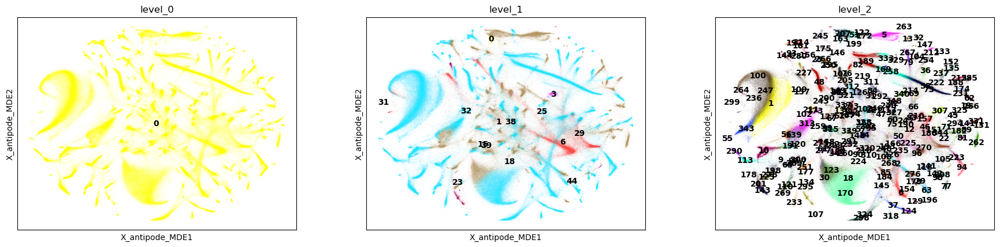

/home/matthew.schmitz/Matthew/utils/miniforge3/envs/pyro/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


/home/matthew.schmitz/Matthew/utils/miniforge3/envs/pyro/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/matthew.schmitz/Matthew/utils/miniforge3/envs/pyro/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/matthew.schmitz/Matthew/utils/miniforge3/envs/pyro/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


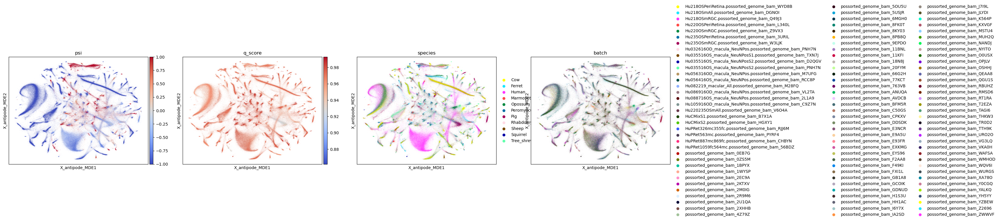

In [12]:
MDE_KEY = "X_antipode_MDE"
#adata.obsm[MDE_KEY] = clip_latent_dimensions(scvi.model.utils.mde(adata.obsm['X_antipode'],init='random'),0.1)
sc.pl.embedding(
    adata,
    basis=MDE_KEY,
    color=["antipode_cluster","kmeans"],legend_fontsize=6,legend_fontweight='normal',
    legend_loc='on data',palette=sc.pl.palettes.godsnot_102
)

sc.pl.embedding(
    adata,
    basis=MDE_KEY,
    color=[x for x in adata.obs.columns if 'level' in x],
    palette=sc.pl.palettes.godsnot_102,
    legend_loc='on data'
)

sc.pl.embedding(
    adata,
    basis=MDE_KEY,
    color=["psi",'q_score',discov_key,batch_key],palette=sc.pl.palettes.godsnot_102,cmap='coolwarm'
)


/home/matthew.schmitz/Matthew/utils/miniforge3/envs/pyro/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/matthew.schmitz/Matthew/utils/miniforge3/envs/pyro/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


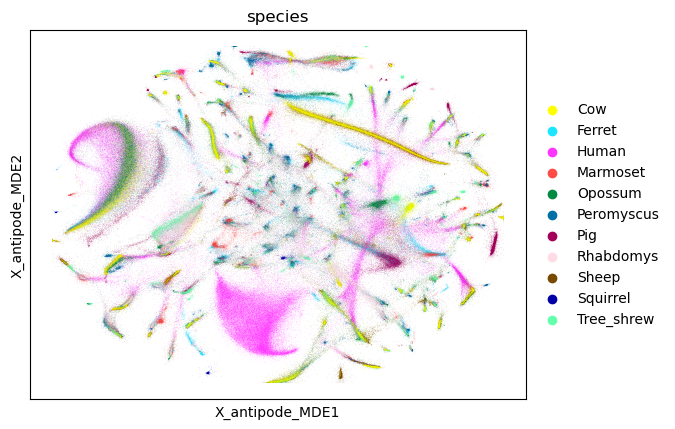

In [13]:
sc.pl.embedding(
    adata,
    basis='X_antipode_MDE',
    color=["species"],palette=sc.pl.palettes.godsnot_102,cmap='coolwarm'
)


# Check in progress

In [3]:
adata=sc.read_h5ad('/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/Team/Matthew/models/1.9.1.8.3_RunRetinaAllNoPsi/p3_adata.h5ad',backed='r')

In [4]:
antipode_model=antipode.antipode_model.ANTIPODE.load('/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/Team/Matthew/models/1.9.1.8.3_RunRetinaAllNoPsi-DeeperBInoReLU',adata=adata,prefix='p1_',device=device)#adata=adata


An NVIDIA GPU may be present on this machine, but a CUDA-enabled jaxlib is not installed. Falling back to cpu.


In [5]:
antipode_model.store_outputs(device=device,prefix='')
MDE_KEY = "X_antipode_MDE"
adata.obsm[MDE_KEY] = clip_latent_dimensions(scvi.model.utils.mde(adata.obsm['X_antipode'],init='random'),0.1)

INFO     Using cuda:0 for `pymde.preserve_neighbors`.                                                              


/home/matthew.schmitz/Matthew/utils/miniforge3/envs/antipode/lib/python3.11/site-packages/lightning/fabric/plugins/environments/slurm.py:191: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python3.11 /home/matthew.schmitz/Matthew/utils/miniforge3/e ...


Apr 26 10:30:39 PM: Your dataset appears to contain duplicated items (rows); when embedding, you should typically have unique items.
Apr 26 10:30:39 PM: The following items have duplicates [187568 187569 187572 187577 187579 187580 187581 187583 187888 188375
 191816 192407 192810 195072]


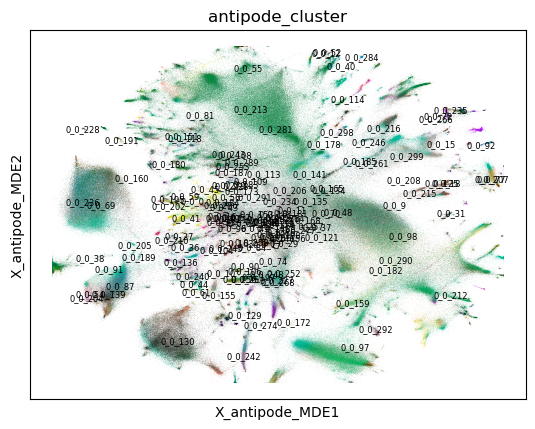

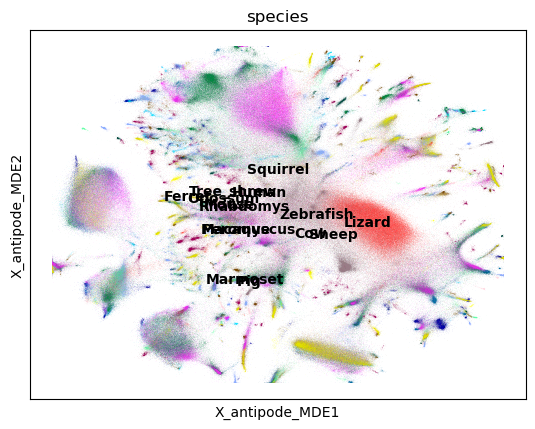

In [6]:
sc.pl.embedding(
    adata,
    basis=MDE_KEY,
    color=["antipode_cluster"],legend_fontsize=6,legend_fontweight='normal',
    legend_loc='on data',palette=sc.pl.palettes.godsnot_102
)

sc.pl.embedding(
    adata,
    basis=MDE_KEY,
    color=['species'],
    palette=sc.pl.palettes.godsnot_102,
    legend_loc='on data'
)


# Pure ANTIPODE


In [3]:
antipode_model=antipode.antipode_model.ANTIPODE.load('/home/matthew.schmitz/Matthew/models/1.9.1.8.3_RunRetinaAllNoPsi/',prefix='p3_',device=device)#adata=adata
adata=antipode_model.adata_manager.adata

In [4]:
# scvi_model=scvi.model.SCVI.load('/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/Team/Matthew/models/1.9.1.8.1_RunRetinaAllNoPsiSCVIsupervise',adata=adata) 
# SCVI_LATENT_KEY = "X_SCVI"
# adata.obsm[SCVI_LATENT_KEY] = scvi_model.get_latent_representation(adata)

In [5]:
batch_key='batch'
discov_key='species'
layer_key='UMIs'


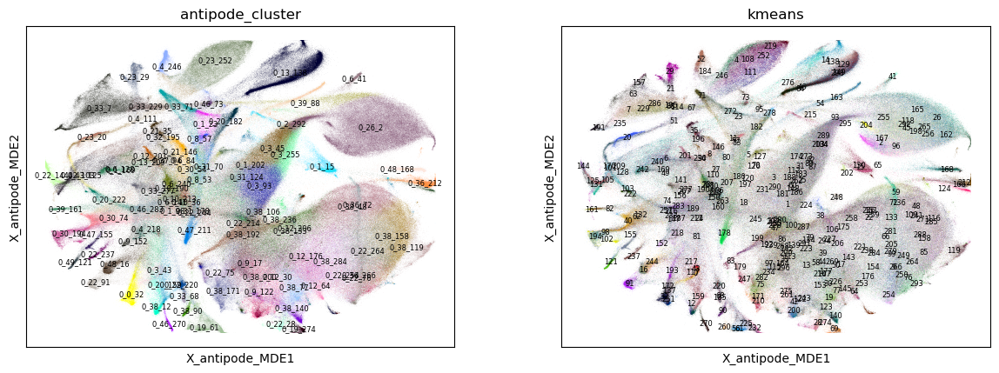

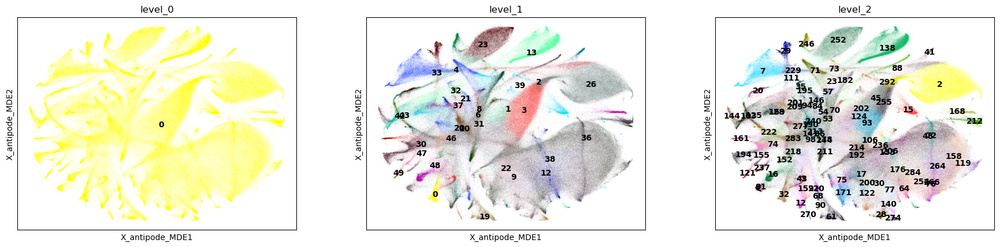

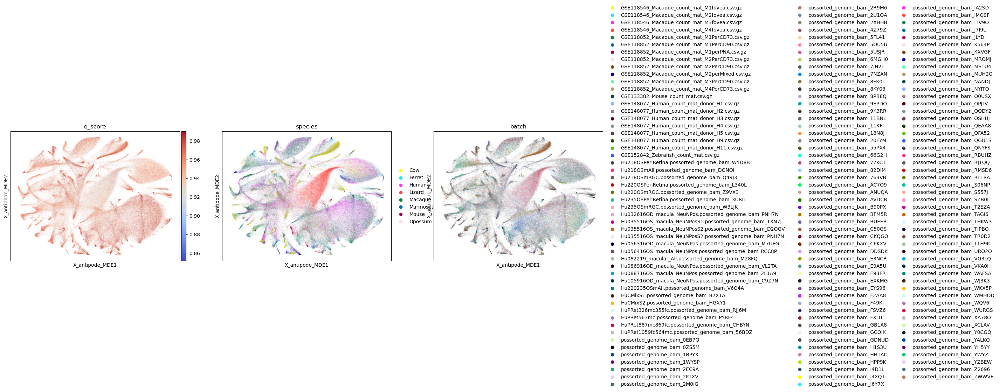

In [6]:
MDE_KEY = "X_antipode_MDE"
#adata.obsm[MDE_KEY] = clip_latent_dimensions(scvi.model.utils.mde(adata.obsm['X_antipode'],init='random'),0.1)
sc.pl.embedding(
    adata,
    basis=MDE_KEY,
    color=["antipode_cluster","kmeans"],legend_fontsize=6,legend_fontweight='normal',
    legend_loc='on data',palette=sc.pl.palettes.godsnot_102
)

sc.pl.embedding(
    adata,
    basis=MDE_KEY,
    color=[x for x in adata.obs.columns if 'level' in x],
    palette=sc.pl.palettes.godsnot_102,
    legend_loc='on data'
)

sc.pl.embedding(
    adata,
    basis=MDE_KEY,
    color=['q_score',discov_key,batch_key],palette=sc.pl.palettes.godsnot_102,cmap='coolwarm'
)


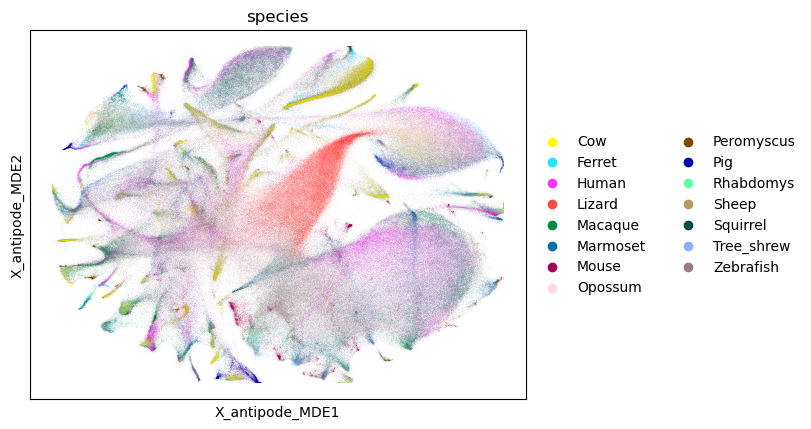

In [7]:
sc.pl.embedding(
    adata,
    basis=MDE_KEY,
    color=["species"],palette=sc.pl.palettes.godsnot_102,cmap='coolwarm'
)


In [8]:
directory='/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/Team/Matthew/data/shekar_retina/metadata'
all_files = [os.path.join(directory, f) for f in os.listdir(directory) if f.endswith('.csv')]

print(all_files)
# Initialize an empty list to store DataFrames
dataframes_list = []

# Iterate over the list of file paths & read each file
for file in all_files:
    print(file)
    df = pd.read_csv(file)
    dataframes_list.append(df)

# Concatenate all DataFrames in the list into a single DataFrame
final_dataframe = pd.concat(dataframes_list, ignore_index=True)
final_dataframe.index=list(final_dataframe['Unnamed: 0'])
final_dataframe=final_dataframe.loc[~final_dataframe.index.duplicated(),:]

['/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/Team/Matthew/data/shekar_retina/metadata/MacaquePeriphery.csv', '/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/Team/Matthew/data/shekar_retina/metadata/Chicken.csv', '/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/Team/Matthew/data/shekar_retina/metadata/Lizard.csv', '/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/Team/Matthew/data/shekar_retina/metadata/Squirrel.csv', '/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/Team/Matthew/data/shekar_retina/metadata/Tree_shrew.csv', '/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/Team/Matthew/data/shekar_retina/metadata/Sheep.csv', '/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/Team/Matthew/data/shekar_retina/metadata/Mouse.csv', '/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/Team/Matthew/data/shekar_retina/metadata/Rhabdomys.csv', '/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/Team/Matt

/scratch/fast/16020663/ipykernel_11805/449100993.py:11: DtypeWarning: Columns (1,4,5) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file)


/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/Team/Matthew/data/shekar_retina/metadata/HumanPeriphery.csv
/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/Team/Matthew/data/shekar_retina/metadata/Zebrafish.csv
/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/Team/Matthew/data/shekar_retina/metadata/Opossum.csv
/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/Team/Matthew/data/shekar_retina/metadata/Ferret.csv
/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/Team/Matthew/data/shekar_retina/metadata/Pig.csv


In [9]:
adata.obs.loc[:,final_dataframe.columns]=final_dataframe

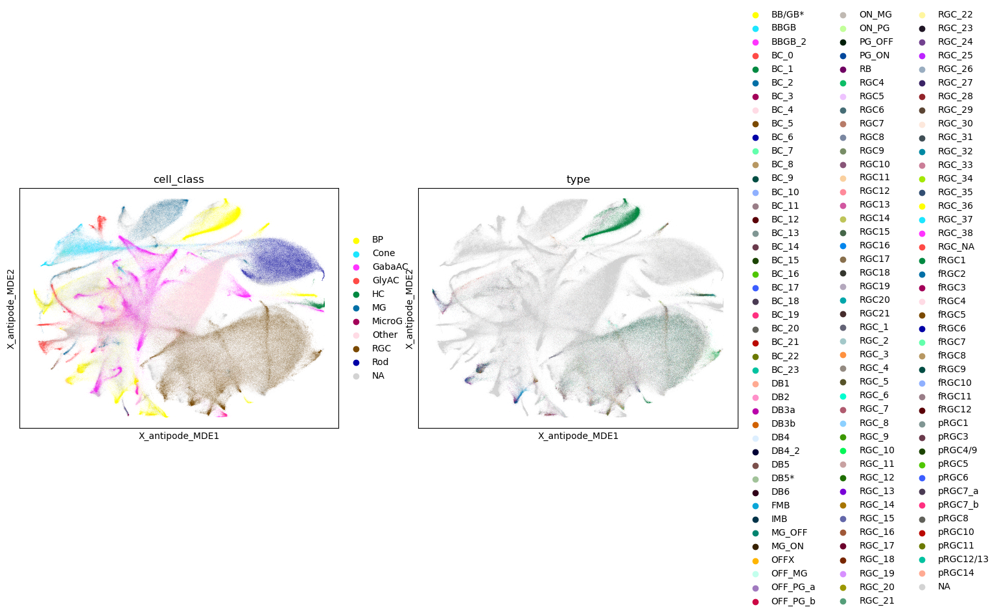

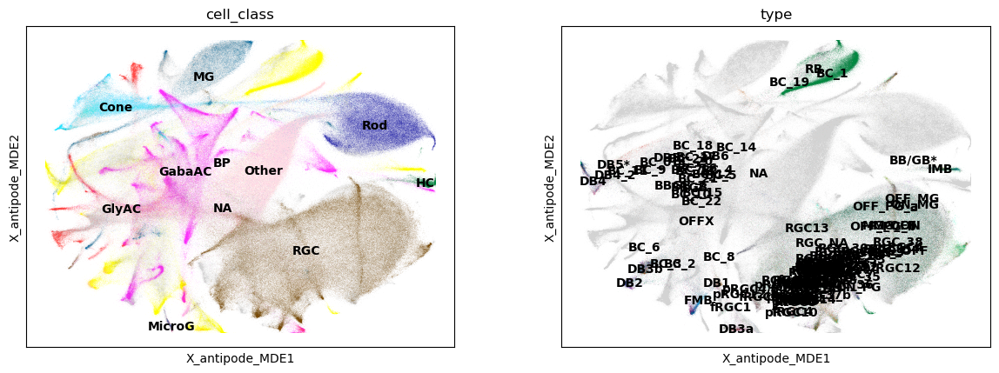

In [10]:
sc.pl.embedding(
    adata,
    basis='X_antipode_MDE',
    color=["cell_class",'type'],palette=sc.pl.palettes.godsnot_102
)
sc.pl.embedding(
    adata,
    basis='X_antipode_MDE',legend_loc='on data',
    color=["cell_class",'type'],palette=sc.pl.palettes.godsnot_102
)

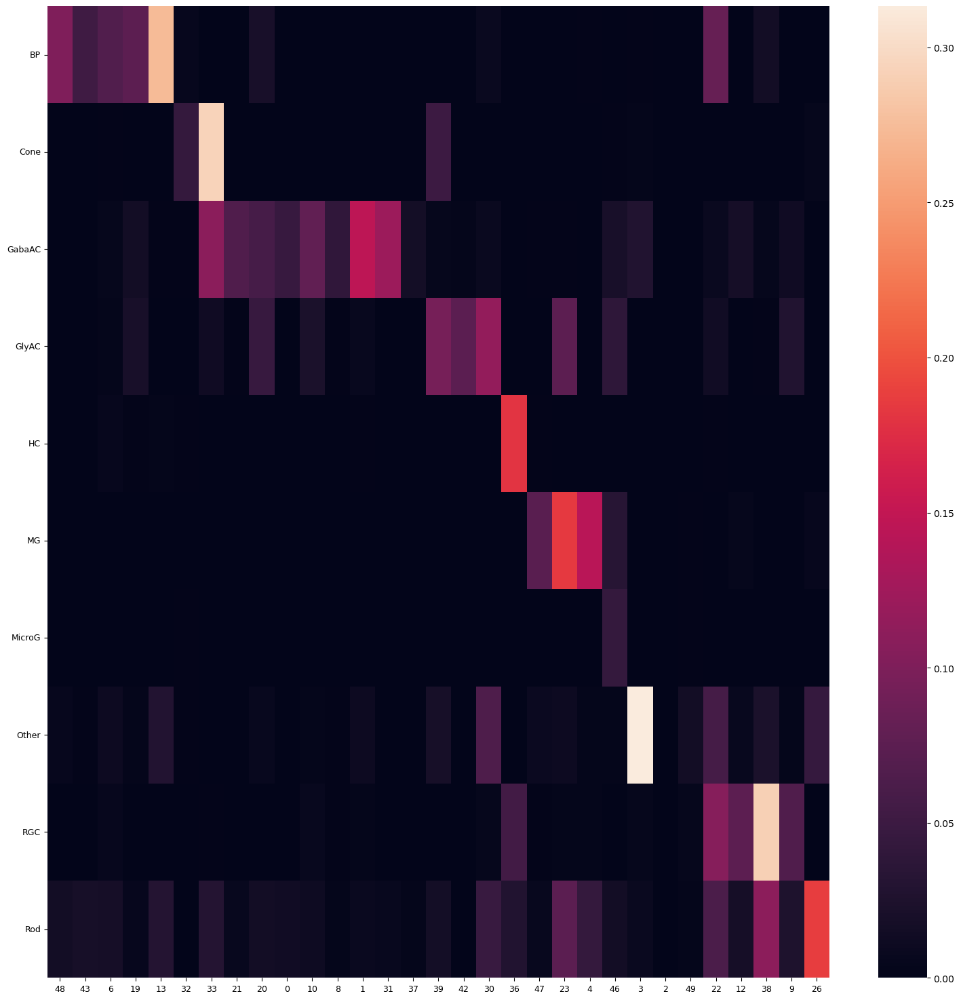

In [11]:
sc_analysis.create_heatmap(sc_analysis.get_cross_category_jaccard(adata.obs,'cell_class','level_1',normalize_jaccard=True))

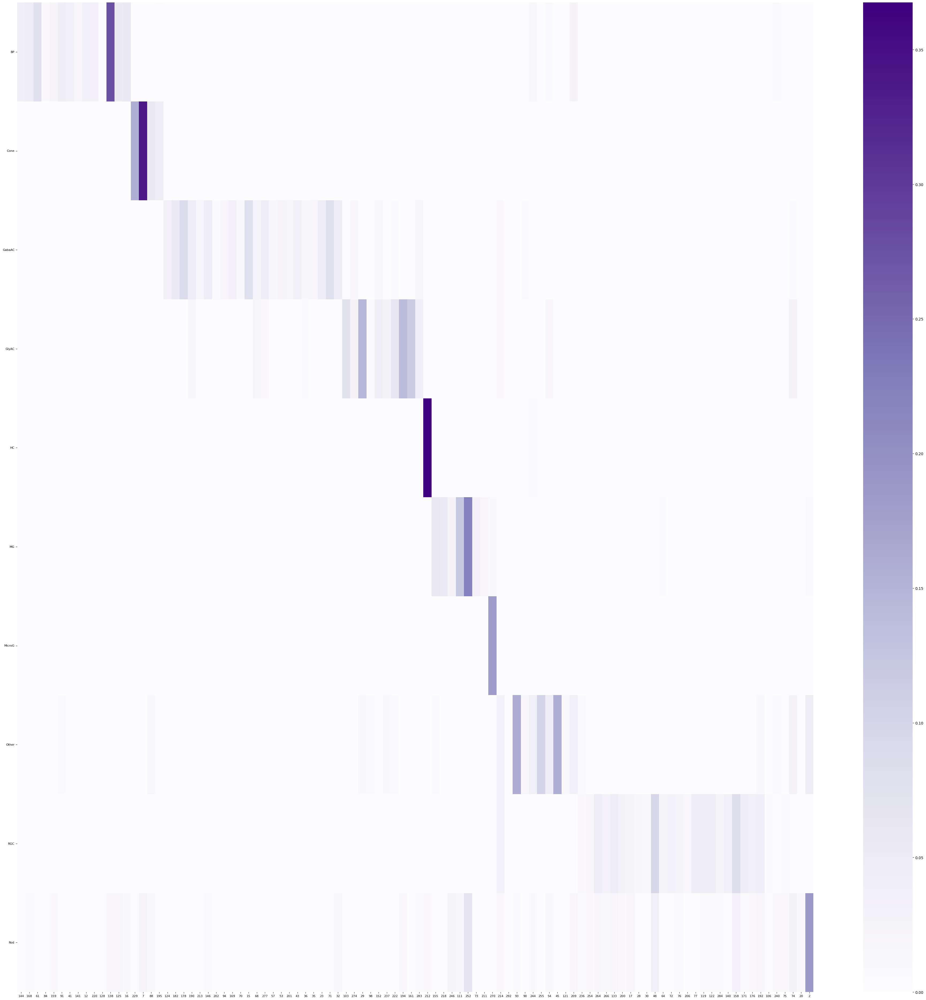

In [12]:
sc_analysis.create_heatmap(sc_analysis.get_cross_category_jaccard(adata.obs,'cell_class','level_2',normalize_jaccard=True),cmap='Purples')

<Axes: xlabel='type'>

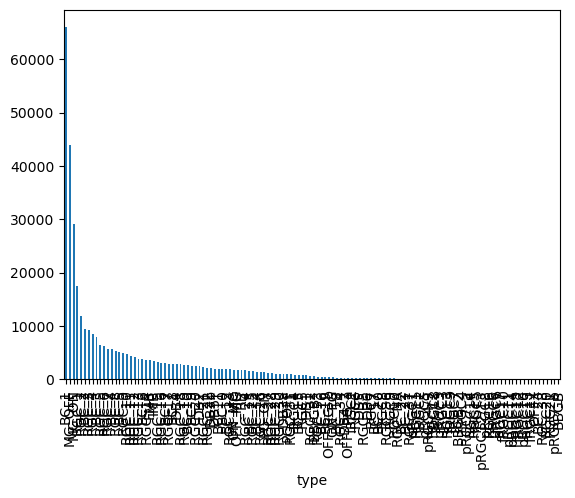

In [13]:
adata.obs['type'].value_counts().plot.bar()

/scratch/fast/16020663/ipykernel_11805/3706739034.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  seaborn.heatmap(adata.obs.groupby('type')['species'].value_counts(normalize=True).unstack())


<Axes: xlabel='species', ylabel='type'>

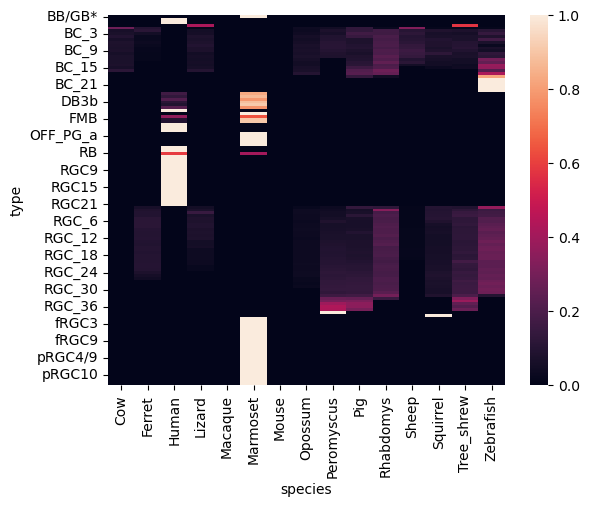

In [14]:
seaborn.heatmap(adata.obs.groupby('type')['species'].value_counts(normalize=True).unstack())

In [15]:
vcs=adata.obs['type'].value_counts()
vcs=vcs[vcs>100]
vcs=vcs[vcs.index!='RGC_NA']

In [16]:
vcs

type
BC_1       65996
MG_OFF     44009
MG_ON      29179
RGC_1      17603
RGC_2      11868
           ...  
fRGC9        111
fRGC7        110
BBGB_2       109
fRGC4        106
pRGC7_a      104
Name: count, Length: 105, dtype: int64

In [17]:
adata.obs['type100']=adata.obs['type']
adata.obs.loc[~adata.obs['type100'].isin(vcs.index),'type100']=np.nan

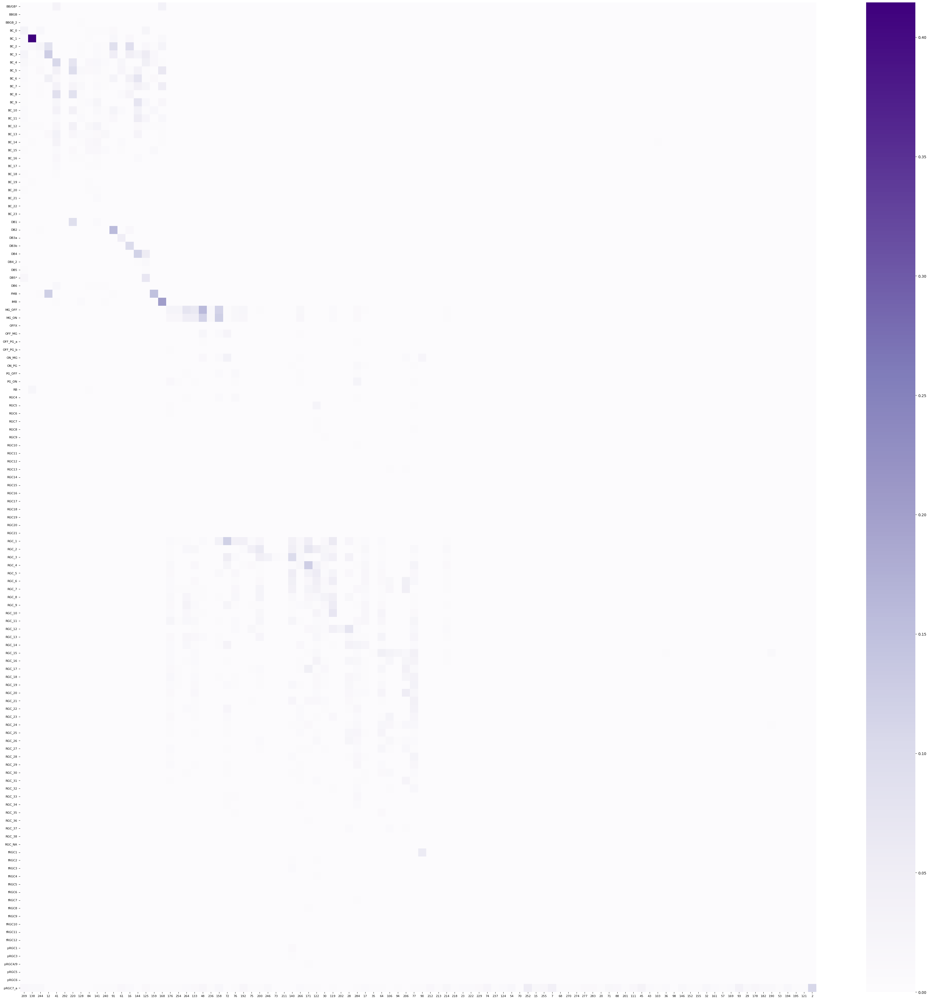

In [18]:
sc_analysis.create_heatmap(sc_analysis.get_cross_category_jaccard(adata.obs,'type100','level_2',normalize_jaccard=True),cmap='Purples')

/home/matthew.schmitz/utils/mts-utils/genomics/sc_analysis.py:152: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[obs1]=df[obs1].astype('category')
/home/matthew.schmitz/utils/mts-utils/genomics/sc_analysis.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[obs2]=df[obs2].astype('category')


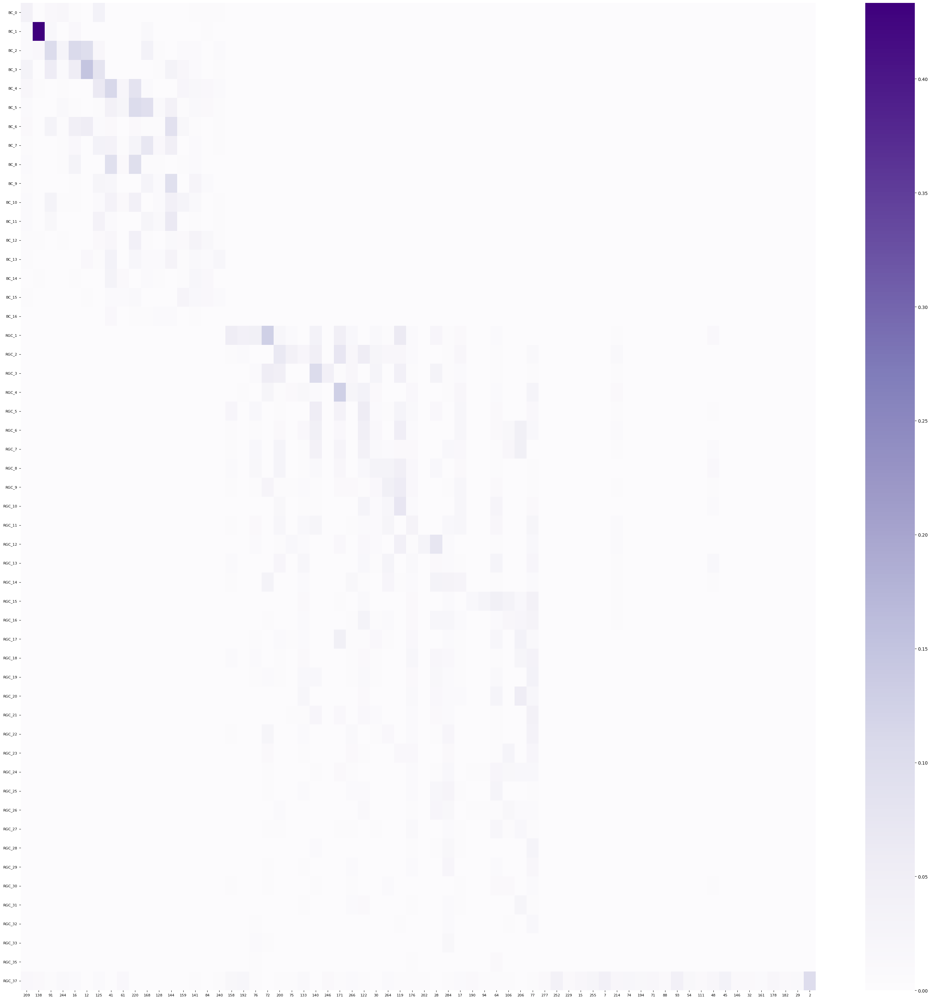

In [19]:
mat=sc_analysis.get_cross_category_jaccard(adata.obs.loc[~adata.obs['species'].isin(['Marmoset','Human']),:],'type100','level_2',normalize_jaccard=True)
mat=mat.loc[:,mat.max(0)>0.01]
mat=mat.loc[mat.max(1)>0.01,:]
mat=mat.loc[mat.index!='RGC_NA',:]
sc_analysis.create_heatmap(mat,cmap='Purples')

In [20]:
sc.tl.dendrogram(adata,groupby='cell_class',use_rep='X_antipode')
sc.tl.dendrogram(adata,groupby='level_2',use_rep='X_antipode')

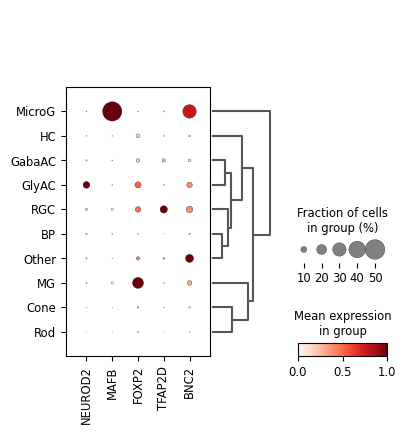

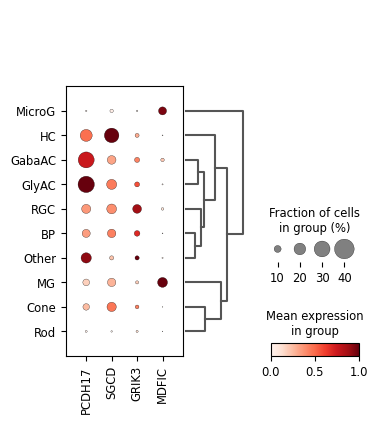

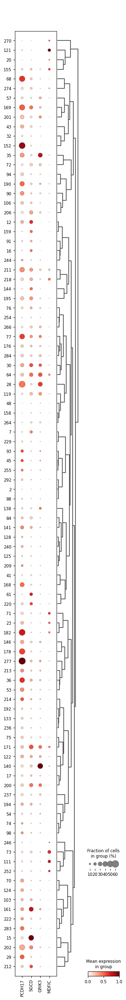

In [21]:
gene_list=['EOMES','IRX3','TBR1','NEUROD2','MAFB','FOXP2','TFAP2D','BNC2']
gene_list=[x for x in gene_list if x in adata.var.index]
sc.pl.dotplot(adata,var_names=gene_list,groupby='cell_class',standard_scale='var',dendrogram=True)
gene_list=['CHST9','TMEM132C','SYT6','CDH6','CDH11','SORCS3','PCDH17','NFIB','RUNX1','SGCD','PLXNA2','GRIK3','TBX20','IRX6','MDFIC','NDST4','PROX1','IL1RAPL2','GULP1','IRX3','RXRG']
gene_list=[x for x in gene_list if x in adata.var.index]
sc.pl.dotplot(adata,var_names=gene_list,groupby='cell_class',standard_scale='var',dendrogram=True)
sc.pl.dotplot(adata,var_names=gene_list,groupby='level_2',standard_scale='var',dendrogram=True)


In [26]:
pstore=adata.uns['param_store']
n_clusters=antipode_model.level_sizes[-1]
prefix=''
level_edges=[numpy_hardmax(antipode_model.adata_manager.adata.uns[prefix+'param_store']['edges_'+str(i)],axis=-1) for i in range(len(antipode_model.level_sizes)-1)]
levels=antipode_model.tree_convergence_bottom_up.just_propagate(np.eye(antipode_model.level_sizes[-1]),level_edges)
prop_taxon=np.concatenate(levels,axis=-1)
prop_locs=numpy_relu(prop_taxon@pstore['locs'])
prop_cluster_intercept=prop_taxon@pstore['cluster_intercept']
cluster_params=(prop_locs@pstore['z_decoder_weight'])+prop_cluster_intercept

<Axes: ylabel='Count'>

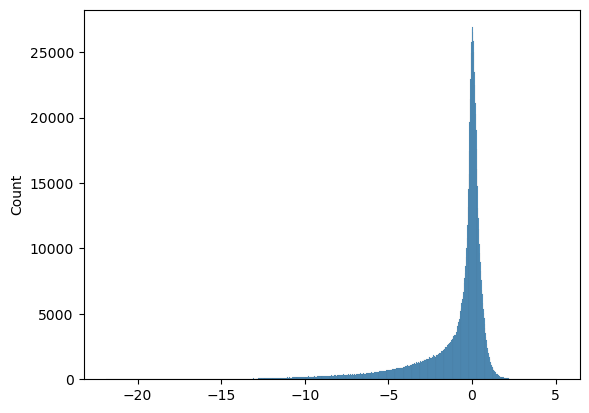

In [27]:
seaborn.histplot(cluster_params.flatten())

### Specific markers

cluster - max

In [28]:
coefs=[]
for i in tqdm.tqdm(range(cluster_params.shape[0]-n_clusters,cluster_params.shape[0])):
    others=list(set(list(range(cluster_params.shape[0])))-set([i]))
    coefs.append((cluster_params[i:(i+1),:]-cluster_params[others,:].max(0)))#/(cluster_params.std(0)+cluster_params.std(0).mean()))
coefs=np.concatenate(coefs,axis=0)

100%|██████████| 300/300 [00:00<00:00, 548.44it/s]


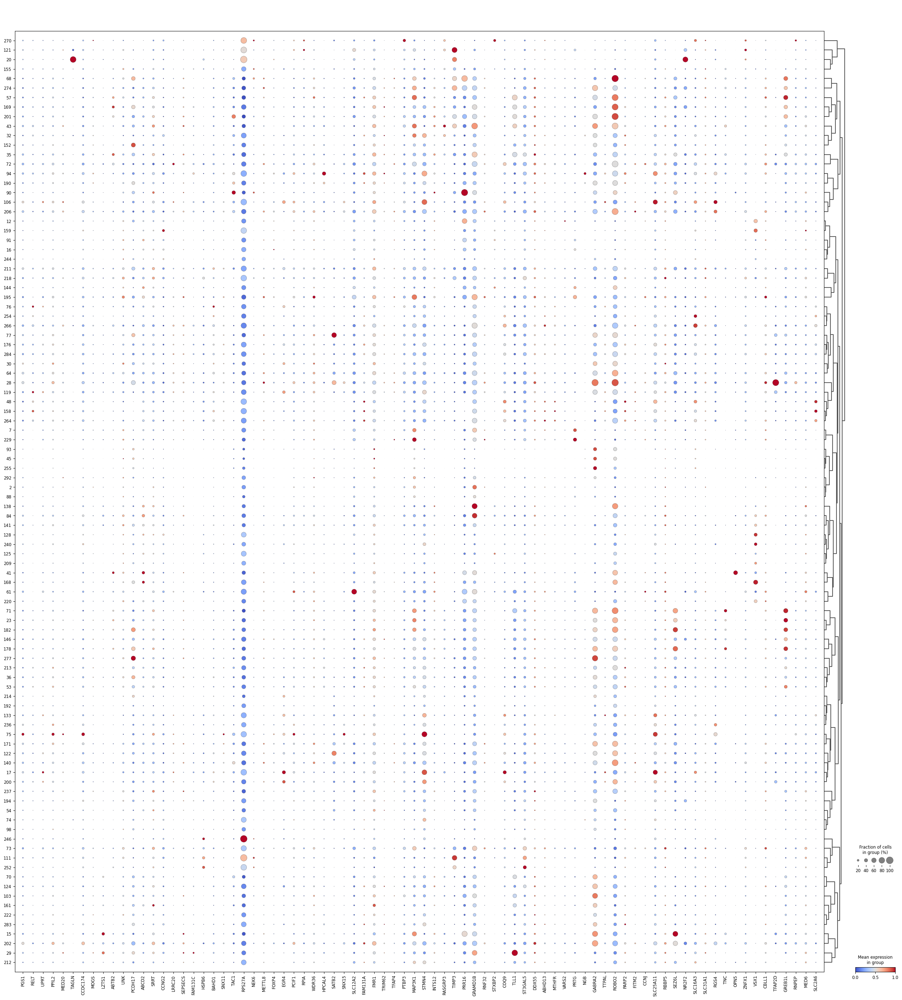

In [29]:
sc.pl.dotplot(adata,groupby='level_2',var_names=pd.DataFrame(coefs.T,index=adata.var.index).idxmax(0)[adata.uns['dendrogram_level_2']['categories_idx_ordered']].unique(),dendrogram=True,standard_scale='var',use_raw=False,cmap='coolwarm')

### Robust Markers

cluster - mean

In [30]:
coefs=[]
for i in tqdm.tqdm(range(cluster_params.shape[0]-n_clusters,cluster_params.shape[0])):
    others=list(set(list(range(cluster_params.shape[0])))-set([i]))
    coefs.append((cluster_params[i:(i+1),:]-cluster_params[others,:].mean(0)))#/(cluster_params.std(0)+cluster_params.std(0).mean()))
coefs=np.concatenate(coefs,axis=0)

100%|██████████| 300/300 [00:00<00:00, 648.30it/s]


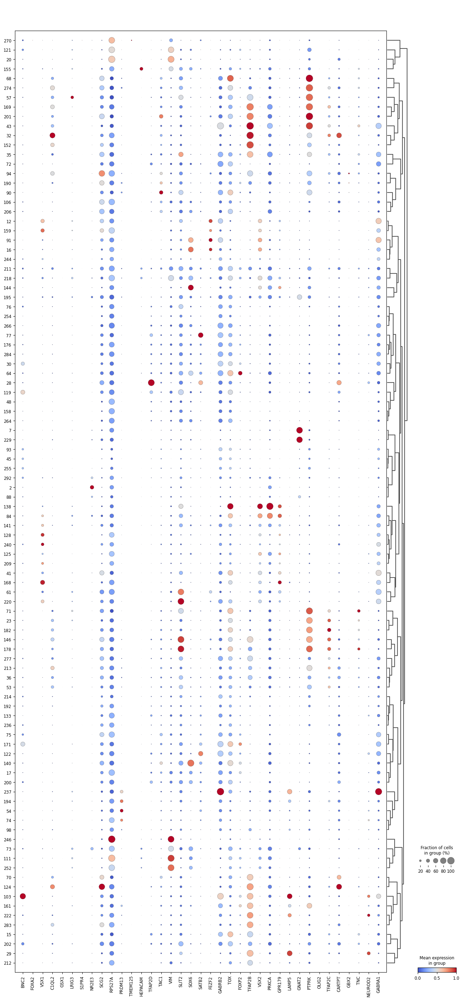

In [31]:
sc.pl.dotplot(adata,groupby='level_2',var_names=pd.DataFrame(coefs.T,index=adata.var.index).idxmax(0)[adata.uns['dendrogram_level_2']['categories_idx_ordered']].unique(),dendrogram=True,standard_scale='var',use_raw=False,cmap='coolwarm')

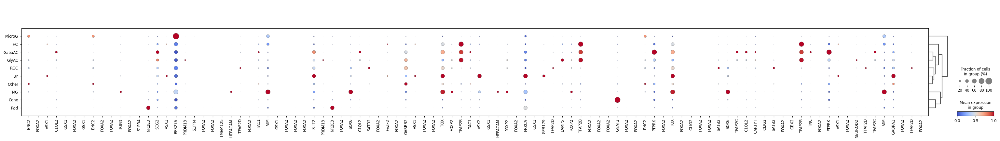

In [32]:
sc.pl.dotplot(adata,groupby='cell_class',var_names=pd.DataFrame(coefs.T,index=adata.var.index).idxmax(0)[adata.uns['dendrogram_level_2']['categories_idx_ordered']],dendrogram=True,standard_scale='var',use_raw=False,cmap='coolwarm')

In [33]:
"""In addition, along the latent edge of the heatmap, add a latent x latent self correlation matrix (set the diagonal to 0), then calculate along the y axis additional annotations for enrichments of """

'In addition, along the latent edge of the heatmap, add a latent x latent self correlation matrix (set the diagonal to 0), then calculate along the y axis additional annotations for enrichments of '

In [34]:
import matplotlib.font_manager
print(matplotlib.font_manager.findSystemFonts(fontpaths=None, fontext='ttf'))
matplotlib.font_manager.font_family_aliases


['/usr/share/fonts/dejavu/DejaVuSansMono.ttf', '/usr/share/fonts/urw-base35/NimbusSansNarrow-BoldOblique.otf', '/usr/share/fonts/dejavu/DejaVuSansCondensed-BoldOblique.ttf', '/usr/share/fonts/urw-base35/URWBookman-Light.otf', '/usr/share/fonts/urw-base35/P052-Bold.otf', '/usr/share/fonts/dejavu/DejaVuSans-Bold.ttf', '/usr/share/fonts/urw-base35/NimbusMonoPS-BoldItalic.otf', '/usr/share/fonts/urw-base35/NimbusSans-Bold.otf', '/usr/share/fonts/urw-base35/P052-Italic.otf', '/usr/share/fonts/dejavu/DejaVuSansMono-Oblique.ttf', '/usr/share/fonts/urw-base35/NimbusSansNarrow-Regular.otf', '/usr/share/fonts/urw-base35/URWBookman-LightItalic.otf', '/usr/share/fonts/urw-base35/P052-Roman.otf', '/usr/share/fonts/dejavu/DejaVuSans-ExtraLight.ttf', '/usr/share/fonts/urw-base35/URWGothic-DemiOblique.otf', '/usr/share/fonts/urw-base35/P052-BoldItalic.otf', '/usr/share/fonts/dejavu/DejaVuSans-BoldOblique.ttf', '/usr/share/fonts/dejavu/DejaVuSansCondensed.ttf', '/usr/share/fonts/dejavu/DejaVuSansMono-B

{'cursive',
 'fantasy',
 'monospace',
 'sans',
 'sans serif',
 'sans-serif',
 'serif'}

In [35]:
%matplotlib inline
import matplotlib.pylab as plt
import pickle
plt.rcParams['figure.dpi'] = 100
plt.rcParams['savefig.dpi']=300
plt.rcParams['font.family'] = 'DejaVu Sans'
plt.rcParams['font.sans-serif']='DejaVuSansMono'
plt.rcParams['pdf.fonttype']=42
import PyComplexHeatmap as pch

In [36]:
adata.obs['species']=adata.obs['species'].cat.reorder_categories(['Human','Macaque', 'Marmoset','Tree_shrew', 'Mouse','Peromyscus',  'Rhabdomys', 'Squirrel','Cow', 'Sheep', 'Pig','Ferret',   
        'Opossum', 'Lizard', 'Zebrafish'])

In [37]:
discov_labels=adata.obs['species'].cat.categories
latent_labels=[str(x) for x in range(pstore['discov_dc'].shape[1])]
cluster_index=sorted(adata.obs['level_2'].astype(int).unique())#list(range(antipode_model.level_sizes[-1]))#list(range(pstore['locs'].shape[0]))
cluster_labels=[str(x) for x in cluster_index]#adapt
cluster_label_dict=dict(zip(cluster_index,cluster_labels))

In [38]:
dc_df=pd.DataFrame(pstore['discov_dc'].var(2).T,index=latent_labels,columns=discov_labels)
dm_df=pd.DataFrame(pstore['discov_dm'][:,cluster_index,:].var(2).T,index=cluster_label,columns=discov_labels)
di_df=pd.DataFrame(pstore['discov_di'][:,cluster_index,:].var(2).T,index=cluster_label,columns=discov_labels)

NameError: name 'cluster_label' is not defined

In [ ]:
loc_df=pd.DataFrame(pstore['locs'][-n_clusters:,:][cluster_index,:],index=cluster_labels,columns=latent_labels)
loc_df=loc_df+(np.random.standard_normal(loc_df.shape)*1e-10)
loc_df.index.name='level_2'

col_linkage=scipy.cluster.hierarchy.linkage(loc_df.T.abs(),method='average',metric='correlation')
latent_label_order_inds=scipy.cluster.hierarchy.leaves_list(col_linkage)
latent_label_order=pd.Series(latent_labels)[scipy.cluster.hierarchy.leaves_list(col_linkage)].to_list()

In [ ]:
cluster_anno_df=pd.DataFrame([pstore['edges_1'].argmax(-1)[cluster_index].astype(str)]).T
cluster_anno_df.columns=['level_1']
cluster_anno_df.index=cluster_labels
#cluster_anno_df.index=[str(x) for x in range(cluster_anno_df.shape[0])]
#cluster_anno_df['cell_class']=adata.obs.groupby('level_2')['cell_class'].value_counts(dropna=True).unstack().idxmax(1)
cluster_anno_df['level_2']=adata.obs['level_2'].cat.categories
cluster_anno_df['cell_class']=adata.obs.groupby('level_2')['cell_class'].value_counts(dropna=True).unstack().idxmax(1)
cluster_anno_df['q_score']=adata.obs.groupby('level_2')['q_score'].mean()
cluster_anno_df['log10_n_counts']=adata.obs.groupby('level_2')['log10_n_counts'].mean()



In [ ]:
left_ha = pch.HeatmapAnnotation(
            cell_class=pch.anno_simple(cluster_anno_df['cell_class'], rasterized=False,cmap='Set1',legend=True),
            level_1=pch.anno_simple(cluster_anno_df.level_1, rasterized=False,legend=False),
            q_score=pch.anno_simple(cluster_anno_df.q_score, rasterized=False,legend=False,cmap='coolwarm'),
            log10_n_counts=pch.anno_simple(cluster_anno_df.log10_n_counts, rasterized=False,legend=False,cmap='coolwarm'),
            axis=0)

In [ ]:
cell_cutoff=25
species_binary=adata.obs.groupby('level_2')['species'].value_counts(normalize=False).unstack()>cell_cutoff

species_mat=adata.obs.groupby('level_2')['species'].value_counts(normalize=False).unstack()
species_mat=(species_mat/species_mat.sum(0))

species_ha_dict={}
for col in species_mat.columns:
    species_ha_dict[col]=pch.anno_simple(species_mat[col],cmap='Blues',legend=False)

for col in species_binary.columns:
    species_ha_dict[col+'>'+str(cell_cutoff)]=pch.anno_simple(species_binary[col],cmap='Grays',legend=False)

for col in dm_df.columns:
    species_ha_dict[col+'_DM']=pch.anno_simple(dm_df[col],cmap='Purples',legend=False)

for col in di_df.columns:
    species_ha_dict[col+'_DI']=pch.anno_simple(di_df[col],cmap='Reds',legend=False)

species_ha_dict['label']=pch.anno_label(cluster_anno_df['level_2'], merge=True, rotation=0,adjust_color=False,colors='black',extend=True,relpos=[-6.,0.],fontsize=2,arrowprops = dict(visible=False))

right_ha = pch.HeatmapAnnotation(**species_ha_dict,axis=0)


In [ ]:
latent_ha_dict={}

for col in dc_df.columns:
    latent_ha_dict[col+'_DC']=pch.anno_simple(dc_df[col],cmap='Oranges',legend=False)

mat_anno_df=pd.DataFrame(np.absolute(pstore['z_decoder_weight'][latent_label_order_inds,:]).sum(1),columns=['absweightsum'],index=latent_labels)

latent_ha_dict['abs_weight_sum']=pch.anno_barplot(mat_anno_df['absweightsum'], cmap='Greys', rasterized=False,legend=False)

bottom_ha = pch.HeatmapAnnotation(**latent_ha_dict,axis=1,orientation='down',plot=False)

In [ ]:
plt.figure(figsize=(15,12))

cm1 = pch.ClusterMapPlotter(data=loc_df,cmap='coolwarm',col_dendrogram=True,col_dendrogram_kws={'linkage':col_linkage},row_dendrogram=True,left_annotation=left_ha,right_annotation=right_ha,bottom_annotation=bottom_ha)